# Analysis of Dominant Factors of CO2 Emissions
### *Kendrick TSANG* 
### *Introduction:*
Currently, the concept of <u>***Environmental, social, and Governance (ESG)***</u> is becoming increasingly prevalent among corporates and societies. Environmental criteria shows how a company safeguards the environment, including corporate policies addressing climate change. To figure out factors that affect CO2 emissions is undoubtedly helping corporates improve their performance in the environmental perspective, and helping societies protect the global environment. 
### *Objective:* 
This project is designed for figuring out <u>***whether person's income is the dominant factor of CO2 emissions***</u> and <u>***any important factors correlated to CO2 emissions***</u>. To facilitate the project, I use datasets from <u>***[GAPMINDER](https://www.gapminder.org/data/)***</u>, including:
- CO2 emission per person
- GDP/capita (US\$, inflation-adjusted) -> shows countries' economy
- Income per person (GDP/capita, PPP\$ inflation-adjusted) -> shows person's income
- Population
- Happiness score (WHR)
- Sustainable Development Index
- Military expenditure (% of GDP)
- Agriculture (% of GDP)
- Industry (% of GDP)
- Services (% of GDP)
- Number of people using internet

## Tasks:
- ***Setup***
- ***Data Loading***
- ***Data Processing and EDA***
- ***Dimension Reduction***
- ***Correlation Analysis***
- ***PCA***

## Setup
- Download external libraries
- Setup working directory 

In [1]:
# Download External Libraries
#% pip install library_name

In [2]:
# Get current directory
import os
os.getcwd()

'/Users/kentsang/Desktop/DataProcessing'

In [3]:
# Change current directory to data file
os.chdir('./data')
# Check whether change is done
os.getcwd()

'/Users/kentsang/Desktop/DataProcessing/data'

## Data Loading
- Load all csv files from data folder
- Print out the data frames to show their data structure

In [5]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from numpy import nan

# load dataset
co2_emission = pd.read_csv(r"co2_emissions_tonnes_per_person.csv", sep=',')
population = pd.read_csv(r"population_total.csv", sep=',')
agriculture = pd.read_csv(r"agriculture_percent_of_gdp.csv", sep=',')
gdp = pd.read_csv(r"gdppercapita_us_inflation_adjusted.csv", sep=',')
person_income = pd.read_csv(r"income_per_person_gdppercapita_ppp_inflation_adjusted.csv", sep=',')
hapiscore = pd.read_csv(r"hapiscore_whr.csv", sep=',')
industry = pd.read_csv(r"industry_percent_of_gdp.csv", sep=',')
services = pd.read_csv(r"services_percent_of_gdp.csv", sep=',')
military_expenditure = pd.read_csv(r"ms_mil_xpnd_gd_zs.csv", sep=',')
internet_users = pd.read_csv(r"net_users_num.csv", sep=',')
sdi = pd.read_csv(r"sdi.csv", sep=',')

# print out the data shape
print("Data Shape of CO2 Emissions Tonnes per Person: ", "\t", co2_emission.shape)
print("Data Shape of Population:", "\t", "\t", "\t","\t", population.shape)
print("Data Shape of GDP per capita: ","\t", "\t","\t","\t", gdp.shape)
print("Data Shape of Agriculture (% of GDP): ", "\t", "\t","\t", agriculture.shape)
print("Data Shape of Industry (% of GDP): ","\t", "\t","\t", industry.shape)
print("Data Shape of Services (% of GDP): ","\t", "\t","\t", services.shape)
print("Data Shape of Military Expenditure (% of GDP): ","\t", military_expenditure.shape)
print("Data Shape of Income per Person: ","\t", "\t","\t", person_income.shape)
print("Data Shape of Happy Score: ","\t", "\t","\t","\t", hapiscore.shape)
print("Data Shape of Number of Internet Users: ","\t", "\t", internet_users.shape)
print("Data Shape of Sustainable Development Index: ","\t", "\t", sdi.shape)

Data Shape of CO2 Emissions Tonnes per Person:  	 (194, 220)
Data Shape of Population: 	 	 	 	 (197, 302)
Data Shape of GDP per capita:  	 	 	 	 (210, 62)
Data Shape of Agriculture (% of GDP):  	 	 	 (205, 62)
Data Shape of Industry (% of GDP):  	 	 	 (204, 62)
Data Shape of Services (% of GDP):  	 	 	 (200, 62)
Data Shape of Military Expenditure (% of GDP):  	 (165, 62)
Data Shape of Income per Person:  	 	 	 (195, 252)
Data Shape of Happy Score:  	 	 	 	 (163, 18)
Data Shape of Number of Internet Users:  	 	 (196, 31)
Data Shape of Sustainable Development Index:  	 	 (164, 31)


In [6]:
co2_emission

,country,1800,1801,1802,1803,1804,1805,1806,1807,1808,...,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018
0,Afghanistan,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.238,0.290,0.406,0.345,0.280,0.253,0.262,0.245,0.247,0.254
1,Angola,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.230,1.240,1.250,1.350,1.280,1.640,1.220,1.180,1.140,1.120
2,Albania,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.470,1.560,1.790,1.690,1.690,1.900,1.600,1.570,1.610,1.590
3,Andorra,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,6.120,6.120,5.870,5.920,5.900,5.830,5.970,6.070,6.270,6.120
4,United Arab Emirates,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,20.900,18.300,18.900,23.800,23.700,24.200,20.700,21.700,21.100,21.400
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
189,Samoa,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.010,1.010,1.080,1.050,1.040,1.090,1.210,1.260,1.290,1.320
190,Yemen,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.080,1.000,0.849,0.747,0.994,0.937,0.480,0.377,0.363,0.356
191,South Africa,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,9.960,9.160,9.160,8.770,8.530,8.860,8.350,8.460,8.120,8.100
192,Zambia,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.182,0.189,0.199,0.241,0.252,0.277,0.271,0.296,0.304,0.302


In [7]:
population

,country,1800,1801,1802,1803,1804,1805,1806,1807,1808,...,2091,2092,2093,2094,2095,2096,2097,2098,2099,2100
0,Afghanistan,3.28M,3.28M,3.28M,3.28M,3.28M,3.28M,3.28M,3.28M,3.28M,...,76.6M,76.4M,76.3M,76.1M,76M,75.8M,75.6M,75.4M,75.2M,74.9M
1,Angola,1.57M,1.57M,1.57M,1.57M,1.57M,1.57M,1.57M,1.57M,1.57M,...,168M,170M,172M,175M,177M,179M,182M,184M,186M,188M
2,Albania,400k,402k,404k,405k,407k,409k,411k,413k,414k,...,1.33M,1.3M,1.27M,1.25M,1.22M,1.19M,1.17M,1.14M,1.11M,1.09M
3,Andorra,2650,2650,2650,2650,2650,2650,2650,2650,2650,...,63k,62.9k,62.9k,62.8k,62.7k,62.7k,62.6k,62.5k,62.5k,62.4k
4,United Arab Emirates,40.2k,40.2k,40.2k,40.2k,40.2k,40.2k,40.2k,40.2k,40.2k,...,12.3M,12.4M,12.5M,12.5M,12.6M,12.7M,12.7M,12.8M,12.8M,12.9M
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
192,Samoa,47.3k,47.3k,47.3k,47.3k,47.3k,47.3k,47.3k,47.2k,47.2k,...,315k,314k,314k,314k,313k,313k,312k,312k,311k,310k
193,Yemen,2.59M,2.59M,2.59M,2.59M,2.59M,2.59M,2.59M,2.59M,2.59M,...,54.5M,54.4M,54.3M,54.1M,54M,53.8M,53.7M,53.5M,53.4M,53.2M
194,South Africa,1.45M,1.45M,1.46M,1.46M,1.47M,1.47M,1.48M,1.49M,1.49M,...,79.8M,79.8M,79.7M,79.7M,79.6M,79.5M,79.5M,79.4M,79.3M,79.2M
195,Zambia,747k,758k,770k,782k,794k,806k,818k,831k,843k,...,74.4M,75.2M,76M,76.8M,77.6M,78.4M,79.2M,80M,80.8M,81.5M


In [8]:
gdp

,country,1960,1961,1962,1963,1964,1965,1966,1967,1968,...,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020
0,Aruba,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,26.6k,26.2k,27.1k,27k,28.4k,28.8k,29.3k,NaN,NaN,NaN
1,Afghanistan,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,512,558,569,565,556,553,553,547,555,530
2,Angola,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,3980,4170,4220,4270,4170,3920,3790,3600,3460,3170
3,Albania,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,3680,3740,3780,3860,3950,4090,4250,4430,4540,4390
4,Andorra,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,35k,33.8k,33.2k,34.7k,35.8k,37.4k,37.7k,38.3k,39k,34.3k
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
205,Samoa,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,4210,4010,3960,3930,4070,4380,4410,4340,4500,4360
206,Yemen,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,2310,2300,2350,2280,1600,1420,1310,1290,NaN,NaN
207,South Africa,3840,3890,4030,4220,4440,4590,4680,4880,4960,...,6180,6230,6280,6270,6260,6210,6190,6200,6130,5660
208,Zambia,1220,1200,1140,1140,1240,1400,1280,1340,1320,...,1240,1300,1320,1340,1340,1350,1350,1370,1350,1270


In [9]:
agriculture

,country,1960,1961,1962,1963,1964,1965,1966,1967,1968,...,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020
0,Aruba,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Afghanistan,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,23.700,24.400,22.800,22.100,20.600,25.700,26.400,22.000,25.800,26.800
2,Angola,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,5.850,6.070,6.510,7.550,9.120,9.830,10.000,8.610,6.660,9.490
3,Albania,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,18.200,18.800,19.600,20.000,19.800,19.800,19.000,18.400,18.400,19.100
4,United Arab Emirates,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.672,0.639,0.644,0.639,0.741,0.776,0.771,0.719,0.747,0.919
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
200,Samoa,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,8.840,9.150,9.710,9.450,8.710,9.130,10.500,9.750,9.730,10.300
201,Yemen,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,8.530,8.440,7.870,7.820,7.100,7.090,6.020,5.000,5.000,5.000
202,South Africa,10.7,11.0,10.6,10.4,9.0,8.76,9.05,9.97,8.37,...,2.040,1.980,1.930,2.130,2.230,2.410,2.490,2.280,1.960,2.530
203,Zambia,11.5,12.8,12.3,13.0,12.0,14.30,13.40,12.80,11.40,...,9.650,9.320,8.230,6.780,4.980,6.230,4.020,3.340,2.860,2.980


In [10]:
services

,country,1960,1961,1962,1963,1964,1965,1966,1967,1968,...,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020
0,Aruba,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Afghanistan,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,49.7,50.6,52.7,53.0,53.2,59.0,58.3,59.5,55.5,54.7
2,Angola,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,39.1,39.6,42.8,46.8,48.7,47.0,46.8,43.2,38.9,39.6
3,Albania,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,44.3,45.0,44.6,45.8,46.3,46.7,48.0,47.8,48.4,48.4
4,United Arab Emirates,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,41.3,41.9,44.4,46.6,55.4,57.8,56.7,52.2,54.8,58.2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195,Samoa,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,72.6,71.5,72.0,72.0,73.8,73.1,72.6,75.0,74.7,74.9
196,Yemen,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,29.0,29.0,27.2,27.3,23.4,23.0,19.2,16.8,16.8,16.8
197,South Africa,48.4,48.2,48.6,48.6,48.8,48.5,48.7,49.4,50.8,...,64.3,64.3,64.1,64.0,64.1,63.9,64.3,64.2,64.4,64.6
198,Zambia,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,50.4,53.2,53.1,53.5,56.2,54.2,52.1,54.2,54.6,53.6


In [11]:
industry

,country,1960,1961,1962,1963,1964,1965,1966,1967,1968,...,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020
0,Aruba,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Afghanistan,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,22.7,21.2,20.4,21.2,22.1,10.5,10.1,13.4,14.1,14.0
2,Angola,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,56.0,56.9,53.4,46.2,41.9,42.6,42.2,47.9,50.0,45.9
3,Albania,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,24.5,22.9,23.1,21.5,21.8,21.1,20.4,21.3,20.6,20.1
4,United Arab Emirates,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,58.0,57.4,55.0,52.8,43.9,41.4,42.6,47.0,44.5,40.9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
199,Samoa,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,18.6,19.4,18.2,18.6,17.5,17.8,16.9,15.2,15.6,14.9
200,Yemen,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,46.5,46.5,43.9,44.0,36.4,46.7,42.2,35.6,35.6,35.6
201,South Africa,35.9,36.2,36.2,36.3,37.2,38.1,37.6,35.9,36.0,...,24.8,24.5,24.6,24.3,23.7,23.8,23.6,23.5,23.6,23.4
202,Zambia,62.2,59.4,58.0,57.7,58.1,53.8,58.8,52.1,54.6,...,34.4,32.0,32.6,32.9,33.7,34.9,37.3,34.5,34.9,40.3


In [12]:
military_expenditure

,country,1960,1961,1962,1963,1964,1965,1966,1967,1968,...,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020
0,Afghanistan,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.820,1.180,1.080,1.300,0.995,0.957,0.945,1.010,1.120,1.370
1,Angola,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,3.260,3.240,4.460,4.700,3.110,2.730,2.510,1.870,1.640,1.620
2,Albania,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.530,1.490,1.410,1.350,1.160,1.100,1.110,1.160,1.290,1.540
3,United Arab Emirates,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,5.470,5.080,6.030,5.640,NaN,NaN,NaN,NaN,NaN,NaN
4,Argentina,1.550,2.14,2.66,1.68,1.15,1.07,1.17,1.40,1.69,...,0.764,0.785,0.838,0.878,0.850,0.813,0.856,0.746,0.706,0.761
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
160,Vietnam,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.980,2.160,2.180,2.290,2.360,2.440,2.270,2.280,NaN,NaN
161,Yemen,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,4.930,4.570,4.080,3.970,NaN,NaN,NaN,NaN,NaN,NaN
162,South Africa,0.951,1.47,2.25,2.06,2.7,2.63,2.7,2.79,2.76,...,1.100,1.130,1.120,1.110,1.100,1.070,1.030,0.985,0.978,1.070
163,Zambia,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.320,1.360,1.360,1.630,1.750,1.430,1.310,1.410,1.220,1.150


In [13]:
person_income

,country,1800,1801,1802,1803,1804,1805,1806,1807,1808,...,2041,2042,2043,2044,2045,2046,2047,2048,2049,2050
0,Afghanistan,683,683,683,683,683,683,683,683,683,...,2690,2750,2810,2870,2930,2990,3060,3120,3190,3260
1,Angola,700,702,705,709,711,714,718,721,725,...,8000,8170,8350,8530,8710,8900,9090,9280,9480,9690
2,Albania,755,755,755,755,755,756,756,756,756,...,25.1k,25.6k,26.2k,26.7k,27.3k,27.9k,28.5k,29.1k,29.7k,30.4k
3,Andorra,1360,1360,1360,1360,1370,1370,1370,1370,1380,...,68.9k,70.4k,71.9k,73.4k,75k,76.6k,78.3k,80k,81.7k,83.4k
4,United Arab Emirates,1130,1130,1140,1140,1150,1150,1160,1160,1160,...,101k,103k,105k,107k,110k,112k,114k,117k,119k,122k
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
190,Samoa,1590,1590,1590,1590,1590,1590,1590,1590,1590,...,8860,9050,9250,9440,9650,9860,10.1k,10.3k,10.5k,10.7k
191,Yemen,993,995,998,1000,1000,1010,1010,1010,1020,...,3750,3830,3910,3990,4080,4170,4260,4350,4440,4540
192,South Africa,1780,1760,1740,1720,1700,1610,1610,1750,1530,...,16.2k,16.6k,16.9k,17.3k,17.7k,18.1k,18.5k,18.8k,19.3k,19.7k
193,Zambia,751,753,755,756,758,760,762,764,765,...,4690,4790,4890,5000,5110,5220,5330,5440,5560,5680


In [14]:
hapiscore

,country,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021
0,Afghanistan,NaN,NaN,NaN,37.2,44.0,47.6,38.3,37.8,35.7,31.3,39.8,42.2,26.6,26.9,23.8,NaN,24.0
1,Angola,NaN,NaN,NaN,NaN,NaN,NaN,55.9,43.6,39.4,38.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Albania,NaN,NaN,46.3,NaN,54.9,52.7,58.7,55.1,45.5,48.1,46.1,45.1,46.4,50.0,50.0,53.6,52.0
3,United Arab Emirates,NaN,67.3,NaN,NaN,68.7,71.0,71.2,72.2,66.2,65.4,65.7,68.3,70.4,66.0,67.1,64.6,65.8
4,Argentina,NaN,63.1,60.7,59.6,64.2,64.4,67.8,64.7,65.8,66.7,67.0,64.3,60.4,57.9,60.9,59.0,59.7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
158,Vietnam,NaN,52.9,54.2,54.8,53.0,53.0,57.7,55.4,50.2,50.9,50.8,50.6,51.8,53.0,54.7,NaN,54.9
159,Yemen,NaN,NaN,44.8,NaN,48.1,43.5,37.5,40.6,42.2,39.7,29.8,38.3,32.5,30.6,42.0,NaN,42.0
160,South Africa,NaN,50.8,52.0,53.5,52.2,46.5,49.3,51.3,36.6,48.3,48.9,47.7,45.1,48.8,50.4,49.5,51.9
161,Zambia,NaN,48.2,40.0,47.3,52.6,NaN,50.0,50.1,52.4,43.5,48.4,43.5,39.3,40.4,33.1,48.4,37.6


In [15]:
internet_users

,country,1990,1991,1992,1993,1994,1995,1996,1997,1998,...,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019
0,Afghanistan,0,0,0,0,0,0,NaN,NaN,NaN,...,1.17M,1.51M,1.7M,1.9M,2.34M,2.84M,3.96M,4.9M,5.02M,5.14M
1,Angola,0,0,0,0,0,0,112,844,2830,...,654k,751k,1.63M,2.32M,5.77M,3.46M,3.75M,4.28M,4.42M,4.56M
2,Albania,0,0,0,0,0,348,998,1510,2020,...,1.33M,1.44M,1.59M,1.66M,1.74M,1.83M,1.92M,2.07M,2.07M,2.01M
3,Andorra,0,0,0,0,0,0,983,1960,4420,...,68.4k,67.8k,71.2k,75.9k,76k,75.6k,75.7k,70.5k,70.5k,70.6k
4,United Arab Emirates,0,0,0,0,0,2490,9530,88k,194k,...,5.81M,6.98M,7.77M,8.09M,8.33M,8.38M,8.48M,9M,9.48M,9.69M
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
191,Samoa,0,0,0,0,0,0,NaN,300,398,...,13k,20.6k,24.4k,29.2k,40.8k,49.2k,57.2k,65.7k,65.9k,66.2k
192,Yemen,0,0,0,0,0,0,96,2400,3840,...,2.86M,3.55M,4.27M,5.03M,5.82M,6.38M,6.68M,7.44M,7.61M,7.79M
193,South Africa,0,5010,15k,45.1k,100k,280k,356k,702k,1.27M,...,12.3M,17.7M,21.7M,25M,26.7M,28.8M,30.4M,32M,32.5M,32.9M
194,Zambia,0,0,0,0,601,799,847,895,2980,...,1.36M,1.61M,1.95M,2.3M,2.93M,3.33M,4.17M,4.69M,2.48M,2.55M


In [16]:
sdi

,country,1990,1991,1992,1993,1994,1995,1996,1997,1998,...,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019
0,Afghanistan,32.5,33.1,34.0,33.5,33.0,35.6,36.0,36.6,37.1,...,50.8,51.4,52.7,53.4,53.8,53.8,54.1,54.5,54.9,55.1
1,Angola,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,55.8,57.4,58.6,59.8,60.8,61.6,62.2,62.7,62.7,62.6
2,Albania,69.9,68.0,66.2,66.5,67.2,68.6,69.5,69.5,70.6,...,79.6,81.1,82.2,82.6,82.6,82.3,82.1,82.1,82.3,82.6
3,United Arab Emirates,46.9,29.2,19.4,12.8,10.6,11.1,9.9,10.2,10.7,...,14.7,13.6,13.2,11.9,11.5,11.0,10.8,10.9,11.0,11.0
4,Argentina,77.1,77.1,77.1,77.5,77.4,77.8,78.0,78.3,78.0,...,81.6,80.6,80.3,78.7,78.2,77.6,77.2,77.2,77.2,77.7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
159,Samoa,68.2,63.1,68.3,68.8,66.5,67.2,68.2,68.4,69.0,...,75.3,75.4,75.1,75.3,75.5,75.9,76.1,76.1,76.0,76.7
160,Yemen,43.1,43.2,43.4,43.7,43.9,44.6,45.4,45.9,46.5,...,54.5,54.5,54.3,54.9,54.1,52.1,51.1,50.3,50.4,50.6
161,South Africa,64.4,65.2,66.7,66.8,66.5,67.1,66.7,65.9,65.4,...,65.1,65.5,66.4,67.4,67.6,68.5,68.5,68.6,68.9,69.0
162,Zambia,45.3,44.9,44.8,45.1,44.6,44.7,44.7,44.8,44.7,...,56.8,57.5,59.2,60.0,60.3,61.3,61.6,62.2,62.6,62.9


### Observations from the above task:
- The number of rows and columns of each dataset is **distinct** from others
- There are some strings like ***K*** and ***M*** right next to the digits
- Lots of ***NaN*** values
- Might need manipulate the dataset one by one

## Data Processing & EDA
- Process the abnormalities of each data set like ***µ, K, M, B***
- Convert them from string to digits like ***10^-3, 10^3, 10^6, 10^9***
- Draw ***line charts*** of each dataset using different colors to show countries, ***X-axis: Year***, ***Y-axis: depends on dataset***
- **Total 11** datasets, **maximum number** of subplots in one plot is **9**, so divide it into two parts:
    - First part shows **7** graphs: 
        - CO2 Emissions
        - Population
        - GDP
        - Person Income, 
        - Happiness Score 
        - Internet Users 
        - Sustainable Development Index
    - Second part shows **5** graphs that use (% of GDP) as units and GDP: 
        - GDP
        - Agriculture
        - Service
        - Industry
        - Military Expenditure
- Use the above graphs to **observe patterns**
- **Sum all the countries** data to show the **World trend**, plot **12** graphs

In [4]:
# Change the current directory to its parent directory
# In order to save graphs in the parent directory
os.chdir('..')
# Check whether change is done
os.getcwd()

'/Users/kentsang/Desktop/DataProcessing'

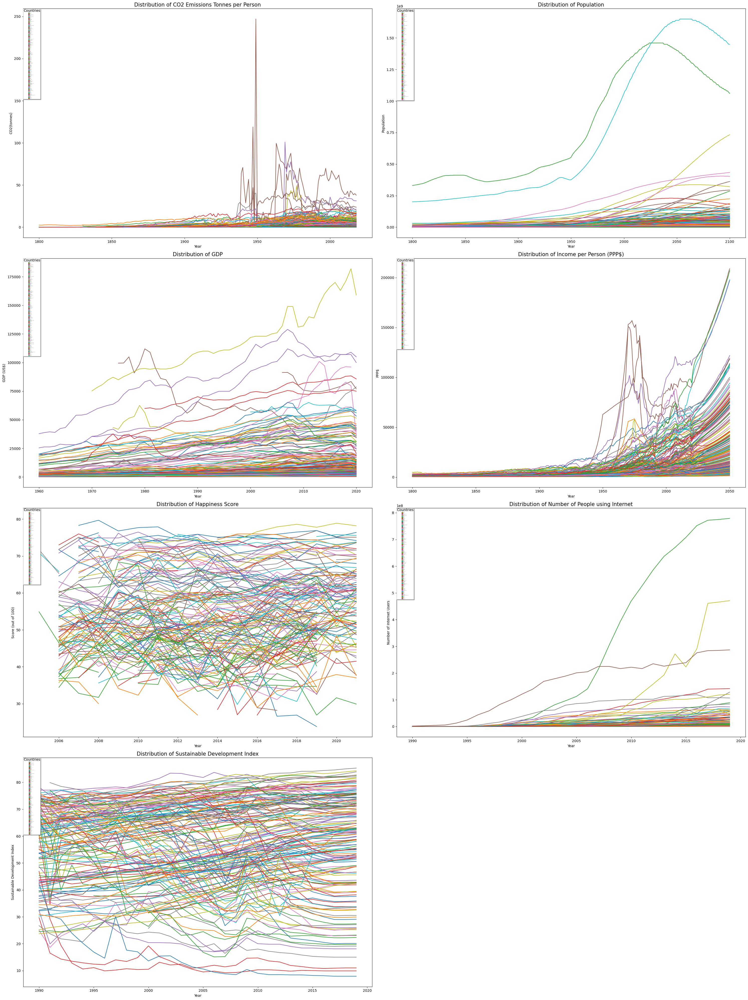

In [18]:
##########################################
##########################################
########## Different Countries ###########
##########################################
##########################################

#######################
#### CO2 Emissions ####
#######################
# select countries
countries_co2 = co2_emission.iloc[:,0].values.astype("str")
# manually change the abnormal value
co2_emission.iloc[6,1:] = co2_emission.iloc[6,1:].str.replace(r'\d\d.', 'NaN', regex=True)
co2_emission.iloc[62,1:] = co2_emission.iloc[62,1:].str.replace(r'\d\d.', 'NaN', regex=True)
co2_emission.iloc[90,1:] = co2_emission.iloc[90,1:].str.replace(r'\d\d.', 'NaN', regex=True)
co2_emission.iloc[90,1:] = co2_emission.iloc[90,1:].str.replace(r'\d\.\w{3}\d{2}', 'NaN', regex=True)
co2_emission.iloc[90,1:] = co2_emission.iloc[90,1:].str.replace(r'\d\.\w{3}\d', 'NaN', regex=True)
co2_emission.iloc[170,1:] = co2_emission.iloc[170,1:].str.replace(r'\d\d.', 'NaN', regex=True)
# fiil NaN with previous one non-null values
#co2_emission.iloc[:,1:] = co2_emission.iloc[:,1:].ffill(axis=1)
# plot
fig = plt.figure(figsize=(30,40), dpi=100)
ax = fig.add_subplot(421)
ax.set_title("Distribution of CO2 Emissions Tonnes per Person", fontsize=15)
# x-axis
years_co2 = co2_emission.columns[1:].values.astype("int")
# draw lines
for i in range(len(countries_co2)):
    ax.plot(years_co2, co2_emission.iloc[i,1:].values, label=countries_co2[i])
# set legends and labels
ax.legend(loc='upper left', title='Countries', shadow=True, fontsize='1')
ax.set_xlabel('Year')
ax.set_ylabel('CO2(tonnes)')

#######################
##### Population ######
#######################
countries_ppl = population.iloc[:,0].values.astype("str")
years_ppl = population.columns[1:].values
# convert K,M,B to digits
for i in range(len(years_ppl)):
    population[years_ppl[i]] = population[years_ppl[i]].replace({'K|k': '*1e3', 'M|m': '*1e6', 'B|b': '*1e9'}, regex=True).apply(lambda x: pd.eval(x)).astype('float64')
# plot
ax = fig.add_subplot(422)
ax.set_title("Distribution of Population", fontsize=15)
# x-axis
years_ppl = population.columns[1:].values.astype("int")
# draw lines
for i in range(len(countries_ppl)):
    ax.plot(years_ppl, population.iloc[i,1:].values, label=countries_ppl[i])
# set legends and labels
ax.legend(loc='upper left', title='Countries', shadow=True, fontsize='1')
ax.set_xlabel('Year')
ax.set_ylabel('Population')

#######################
######## GDP ##########
#######################
countries_gdp = gdp.iloc[:,0].values.astype("str")
years_gdp = gdp.columns[1:].values
for i in range(len(years_gdp)):
    gdp[years_gdp[i]] = gdp[years_gdp[i]].replace({'K|k': '*1e3', 'M|m': '*1e6', 'B|b': '*1e9'}, regex=True).apply(lambda x: pd.eval(x)).astype('float64')
# plot
ax = fig.add_subplot(423)
ax.set_title("Distribution of GDP", fontsize=15)
# x-axis
years_gdp = gdp.columns[1:].values.astype("int")
# draw lines
for i in range(len(countries_gdp)):
    ax.plot(years_gdp, gdp.iloc[i,1:].values, label=countries_gdp[i])
# set legends and labels
ax.legend(loc='upper left', title='Countries', shadow=True, fontsize='1')
ax.set_xlabel('Year')
ax.set_ylabel('GDP (US$)')

#######################
#### Person Income ####
#######################
countries_person_income = person_income.iloc[:,0].values.astype("str")
years_person_income = person_income.columns[1:].values
for i in range(len(years_person_income)):
    person_income[years_person_income[i]] = person_income[years_person_income[i]].replace({'K|k': '*1e3', 'M|m': '*1e6', 'B|b': '*1e9', 'µ': '*1e-6'}, regex=True).apply(lambda x: pd.eval(x)).astype('float64')
# plot
ax = fig.add_subplot(424)
ax.set_title("Distribution of Income per Person (PPP$)", fontsize=15)
# x-axis
years_person_income = person_income.columns[1:].values.astype("int")
# draw lines
for i in range(len(countries_person_income)):
    ax.plot(years_person_income, person_income.iloc[i,1:].values, label=countries_person_income[i])
# set legends and labels
ax.legend(loc='upper left', title='Countries', shadow=True, fontsize='1')
ax.set_xlabel('Year')
ax.set_ylabel('PPP$')

#######################
### Happiness Score ###
#######################
countries_hapiscore = hapiscore.iloc[:,0].values.astype("str")
years_hapiscore = hapiscore.columns[1:].values.astype("int")
# plot
ax = fig.add_subplot(425)
ax.set_title("Distribution of Happiness Score", fontsize=15)
# draw lines
for i in range(len(countries_hapiscore)):
    ax.plot(years_hapiscore, hapiscore.iloc[i,1:].values, label=countries_hapiscore[i])
# set legends and labels
ax.legend(loc='upper left', title='Countries', shadow=True, fontsize='1')
ax.set_xlabel('Year')
ax.set_ylabel('Score (out of 100)')

########################
#### Internet Users ####
########################
countries_internet_users = internet_users.iloc[:,0].values.astype("str")
years_internet_users = internet_users.columns[1:].values
for i in range(len(years_internet_users)):
    internet_users[years_internet_users[i]] = internet_users[years_internet_users[i]].replace({'K|k': '*1e3', 'M|m': '*1e6', 'B|b': '*1e9', 'µ': '*1e-6'}, regex=True).apply(lambda x: pd.eval(x)).astype('float64')
# plot
ax = fig.add_subplot(426)
ax.set_title("Distribution of Number of People using Internet", fontsize=15)
# x-axis
years_internet_users = internet_users.columns[1:].values.astype("int")
# draw lines
for i in range(len(countries_internet_users)):
    ax.plot(years_internet_users, internet_users.iloc[i,1:].values, label=countries_internet_users[i])
# set legends and labels
ax.legend(loc='upper left', title='Countries', shadow=True, fontsize='1')
ax.set_xlabel('Year')
ax.set_ylabel('Number of Internet Users')

#####################################
### Sustainable Development Index ###
#####################################
countries_sdi = sdi.iloc[:,0].values.astype("str")
years_sdi = sdi.columns[1:].values.astype("int")
# plot
ax = fig.add_subplot(427)
ax.set_title("Distribution of Sustainable Development Index", fontsize=15)
# draw lines
for i in range(len(countries_sdi)):
    ax.plot(years_sdi, sdi.iloc[i,1:].values, label=countries_sdi[i])
# set legends and labels
ax.legend(loc='upper left', title='Countries', shadow=True, fontsize='1')
ax.set_xlabel('Year')
ax.set_ylabel('Sustainable Development Index')

plt.savefig("Result")
plt.tight_layout()

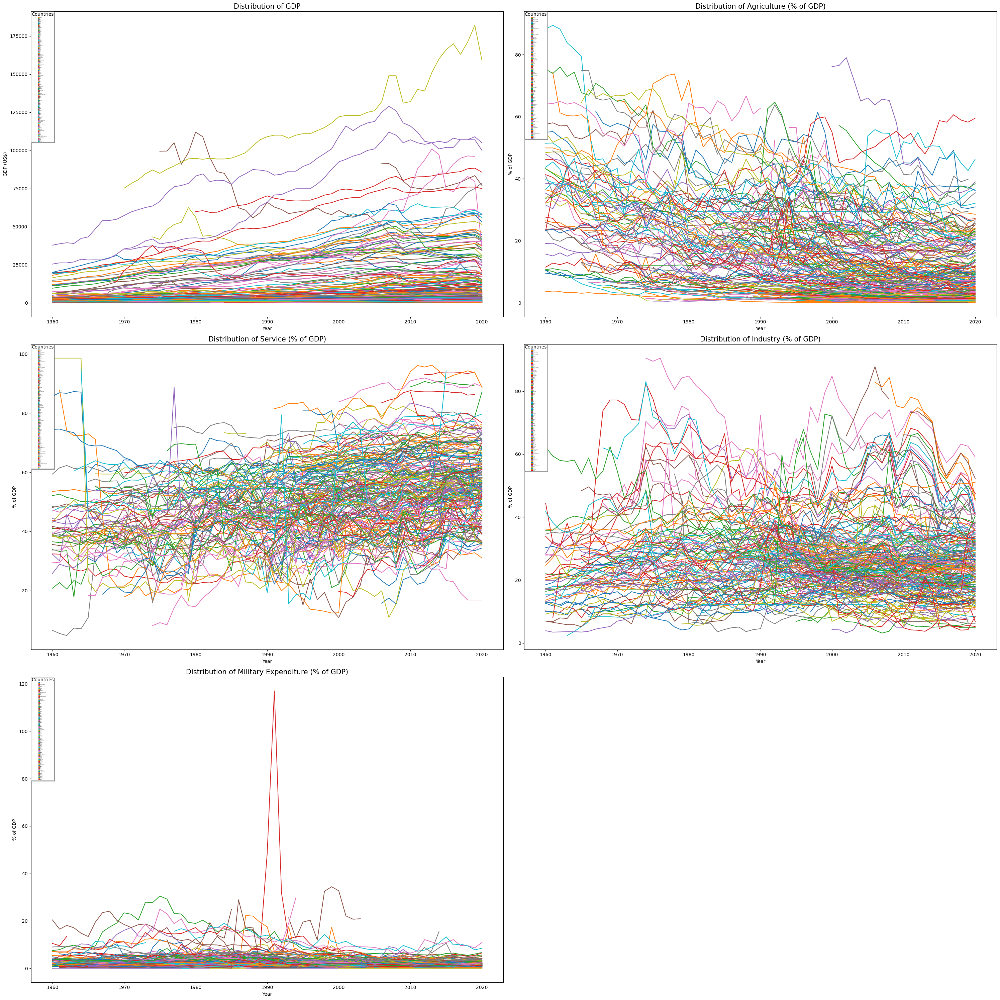

In [19]:
##########################################
##########################################
########## Different Countries ###########
##########################################
##########################################


#######################
######## GDP ##########
#######################
countries_gdp = gdp.iloc[:,0].values.astype("str")
years_gdp = gdp.columns[1:].values
for i in range(len(years_gdp)):
    gdp[years_gdp[i]] = gdp[years_gdp[i]].replace({'K|k': '*1e3', 'M|m': '*1e6', 'B|b': '*1e9'}, regex=True).apply(lambda x: pd.eval(x)).astype('float64')
# plot
fig = plt.figure(figsize=(30,30), dpi=100)
ax = fig.add_subplot(321)
ax.set_title("Distribution of GDP", fontsize=15)
# x-axis
years_gdp = gdp.columns[1:].values.astype("int")
# draw lines
for i in range(len(countries_gdp)):
    ax.plot(years_gdp, gdp.iloc[i,1:].values, label=countries_gdp[i])
# set legends and labels
ax.legend(loc='upper left', title='Countries', shadow=True, fontsize='1')
ax.set_xlabel('Year')
ax.set_ylabel('GDP (US$)')

#######################
##### Agriculture #####
#######################
countries_agriculture = agriculture.iloc[:,0].values.astype("str")
years_agriculture = agriculture.columns[1:].values.astype("int")
# plot
ax = fig.add_subplot(322)
ax.set_title("Distribution of Agriculture (% of GDP)", fontsize=15)
# draw lines
for i in range(len(countries_agriculture)):
    ax.plot(years_agriculture, agriculture.iloc[i,1:].values, label=countries_agriculture[i])
# set legends and labels
ax.legend(loc='upper left', title='Countries', shadow=True, fontsize='1')
ax.set_xlabel('Year')
ax.set_ylabel('% of GDP')

#######################
####### Service #######
#######################
countries_services = services.iloc[:,0].values.astype("str")
years_services = services.columns[1:].values.astype("int")
# plot
ax = fig.add_subplot(323)
ax.set_title("Distribution of Service (% of GDP)", fontsize=15)
# draw lines
for i in range(len(countries_services)):
    ax.plot(years_services, services.iloc[i,1:].values, label=countries_services[i])
# set legends and labels
ax.legend(loc='upper left', title='Countries', shadow=True, fontsize='1')
ax.set_xlabel('Year')
ax.set_ylabel('% of GDP')

#######################
####### Industry ######
#######################
countries_industry = industry.iloc[:,0].values.astype("str")
years_industry = industry.columns[1:].values.astype("int")
# plot
ax = fig.add_subplot(324)
ax.set_title("Distribution of Industry (% of GDP)", fontsize=15)
# draw lines
for i in range(len(countries_industry)):
    ax.plot(years_industry, industry.iloc[i,1:].values, label=countries_industry[i])
# set legends and labels
ax.legend(loc='upper left', title='Countries', shadow=True, fontsize='1')
ax.set_xlabel('Year')
ax.set_ylabel('% of GDP')

##########################
## Military Expenditure ##
##########################
countries_military_expenditure = military_expenditure.iloc[:,0].values.astype("str")
years_military_expenditure = military_expenditure.columns[1:].values
# Convert µ to 10^-6
for i in range(len(years_military_expenditure)):
    military_expenditure[years_military_expenditure[i]] = military_expenditure[years_military_expenditure[i]].replace({'K|k': '*1e3', 'M|m': '*1e6', 'B|b': '*1e9', 'µ': '*1e-6'}, regex=True).apply(lambda x: pd.eval(x)).astype('float64')
# plot
years_military_expenditure = military_expenditure.columns[1:].values.astype("int")
ax = fig.add_subplot(325)
ax.set_title("Distribution of Military Expenditure (% of GDP)", fontsize=15)
# draw lines
for i in range(len(countries_military_expenditure)):
    ax.plot(years_military_expenditure, military_expenditure.iloc[i,1:].values, label=countries_military_expenditure[i])
# set legends and labels
ax.legend(loc='upper left', title='Countries', shadow=True, fontsize='1')
ax.set_xlabel('Year')
ax.set_ylabel('% of GDP')

plt.savefig("GDP Groups")
plt.tight_layout()

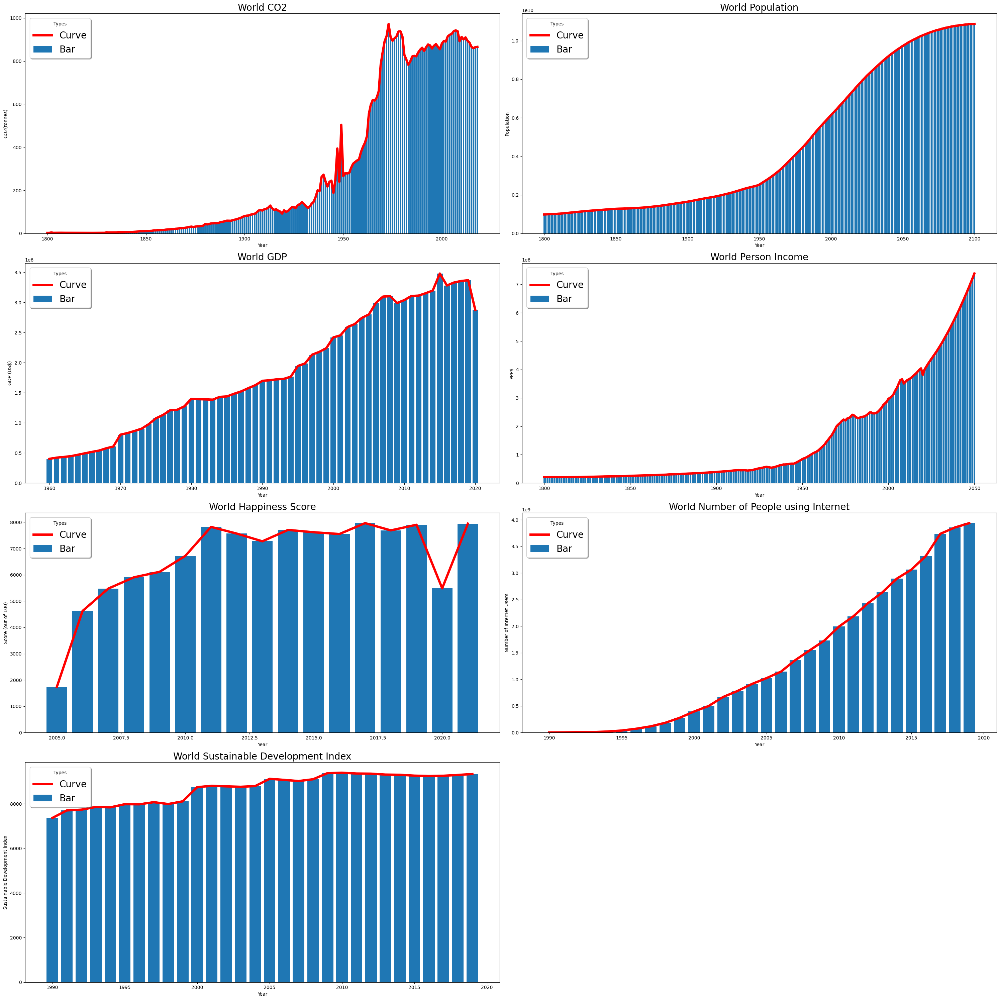

In [20]:
########################################
################## #### ################
################# World ################
################  ####  ################
########################################

#######################
#### CO2 Emissions ####
#######################
co2_world = co2_emission.iloc[:,1:]
co2_world.iloc[:,:] = co2_world.iloc[:,:].values.astype("float64")
co2_world = pd.DataFrame(co2_world.sum(), columns=['Sum'])
# plot
fig = plt.figure(figsize=(30,30), dpi=100)
ax = fig.add_subplot(421)
ax.set_title("World CO2", fontsize=20)
# x-axis
plt.bar(years_co2, co2_world.values.reshape(len(co2_world)), label='Bar')
ax.plot(years_co2, co2_world,'r-',linewidth='5', label='Curve')
# set legends and labels
ax.legend(loc='upper left', title='Types', shadow=True, fontsize='20')
ax.set_xlabel('Year')
ax.set_ylabel('CO2(tonnes)')

#######################
##### Population ######
#######################
ppl_world = population.iloc[:,1:]
ppl_world.iloc[:,:] = ppl_world.iloc[:,:].values.astype("float64")
ppl_world = pd.DataFrame(ppl_world.sum(), columns=['Sum'])
ax = fig.add_subplot(422)
ax.set_title("World Population", fontsize=20)
# x-axis
plt.bar(years_ppl, ppl_world.values.reshape(len(ppl_world)), label='Bar')
ax.plot(years_ppl, ppl_world,'r-',linewidth='5', label='Curve')
# set legends and labels
ax.legend(loc='upper left', title='Types', shadow=True, fontsize='20')
ax.set_xlabel('Year')
ax.set_ylabel('Population')


#######################
######## GDP ##########
#######################
gdp_world = gdp.iloc[:,1:]
gdp_world.iloc[:,:] = gdp_world.iloc[:,:].values.astype("float64")
gdp_world = pd.DataFrame(gdp_world.sum(), columns=['Sum'])
ax = fig.add_subplot(423)
ax.set_title("World GDP", fontsize=20)
plt.bar(years_gdp, gdp_world.values.reshape(len(gdp_world)), label='Bar')
ax.plot(years_gdp, gdp_world,'r-',linewidth='5', label='Curve')
ax.legend(loc='upper left', title='Types', shadow=True, fontsize='20')
ax.set_xlabel('Year')
ax.set_ylabel('GDP (US$)')


#######################
#### Person Income ####
#######################
person_income_world = person_income.iloc[:,1:]
person_income_world.iloc[:,:] = person_income_world.iloc[:,:].values.astype("float64")
person_income_world = pd.DataFrame(person_income_world.sum(), columns=['Sum'])
ax = fig.add_subplot(424)
ax.set_title("World Person Income", fontsize=20)
plt.bar(years_person_income, person_income_world.values.reshape(len(person_income_world)), label='Bar')
ax.plot(years_person_income, person_income_world,'r-',linewidth='5', label='Curve')
ax.legend(loc='upper left', title='Types', shadow=True, fontsize='20')
ax.set_xlabel('Year')
ax.set_ylabel('PPP$')

#######################
### Happiness Score ###
#######################
hapiscore_world = hapiscore.iloc[:,1:]
hapiscore_world.iloc[:,:] = hapiscore_world.iloc[:,:].values.astype("float64")
hapiscore_world = pd.DataFrame(hapiscore_world.sum(), columns=['Sum'])
ax = fig.add_subplot(425)
ax.set_title("World Happiness Score", fontsize=20)
plt.bar(years_hapiscore, hapiscore_world.values.reshape(len(hapiscore_world)), label='Bar')
ax.plot(years_hapiscore, hapiscore_world,'r-',linewidth='5', label='Curve')
ax.legend(loc='upper left', title='Types', shadow=True, fontsize='20')
ax.set_xlabel('Year')
ax.set_ylabel('Score (out of 100)')


########################
#### Internet Users ####
########################
internet_users_world = internet_users.iloc[:,1:]
internet_users_world.iloc[:,:] = internet_users_world.iloc[:,:].values.astype("float64")
internet_users_world = pd.DataFrame(internet_users_world.sum(), columns=['Sum'])
ax = fig.add_subplot(426)
ax.set_title("World Number of People using Internet", fontsize=20)
plt.bar(years_internet_users, internet_users_world.values.reshape(len(internet_users_world)), label='Bar')
ax.plot(years_internet_users, internet_users_world,'r-',linewidth='5', label='Curve')
ax.legend(loc='upper left', title='Types', shadow=True, fontsize='20')
ax.set_xlabel('Year')
ax.set_ylabel('Number of Internet Users')


#####################################
### Sustainable Development Index ###
#####################################
sdi_world = sdi.iloc[:,1:]
sdi_world.iloc[:,:] = sdi_world.iloc[:,:].values.astype("float64")
sdi_world = pd.DataFrame(sdi_world.sum(), columns=['Sum'])
# plot
ax = fig.add_subplot(427)
ax.set_title("World Sustainable Development Index", fontsize=20)
# x-axis
plt.bar(years_sdi, sdi_world.values.reshape(len(sdi_world)), label='Bar')
ax.plot(years_sdi, sdi_world,'r-',linewidth='5', label='Curve')
# set legends and labels
ax.legend(loc='upper left', title='Types', shadow=True, fontsize='20')
ax.set_xlabel('Year')
ax.set_ylabel('Sustainable Development Index')


plt.savefig("World")
plt.tight_layout()

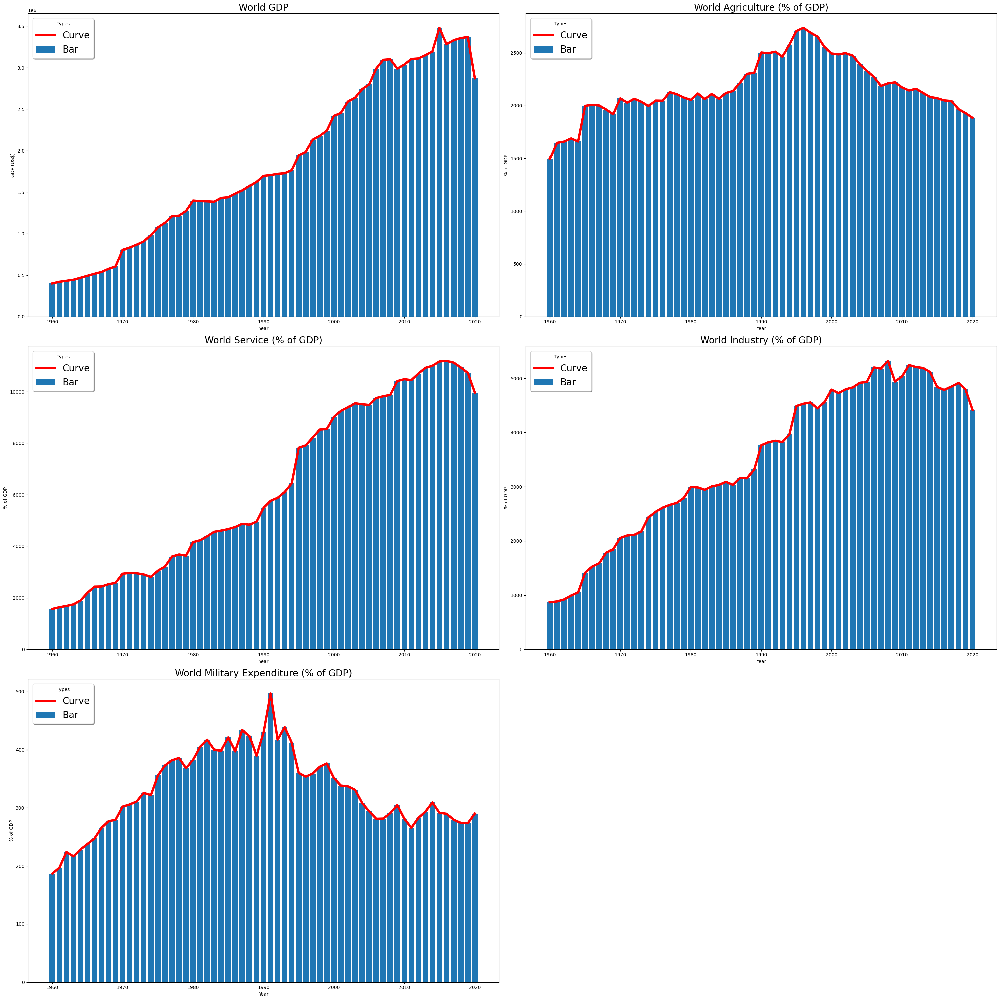

In [21]:
########################################
################## #### ################
################# World ################
################  ####  ################
########################################


#######################
######## GDP ##########
#######################
gdp_world = gdp.iloc[:,1:]
gdp_world.iloc[:,:] = gdp_world.iloc[:,:].values.astype("float64")
gdp_world = pd.DataFrame(gdp_world.sum(), columns=['Sum'])
# plot
fig = plt.figure(figsize=(30,30), dpi=100)
ax = fig.add_subplot(321)
ax.set_title("World GDP", fontsize=20)
plt.bar(years_gdp, gdp_world.values.reshape(len(gdp_world)), label='Bar')
ax.plot(years_gdp, gdp_world,'r-',linewidth='5', label='Curve')
ax.legend(loc='upper left', title='Types', shadow=True, fontsize='20')
ax.set_xlabel('Year')
ax.set_ylabel('GDP (US$)')

#######################
##### Agriculture #####
#######################
agriculture_world = agriculture.iloc[:,1:]
agriculture_world.iloc[:,:] = agriculture_world.iloc[:,:].values.astype("float64")
agriculture_world = pd.DataFrame(agriculture_world.sum(), columns=['Sum'])
ax = fig.add_subplot(322)
ax.set_title("World Agriculture (% of GDP)", fontsize=20)
plt.bar(years_agriculture, agriculture_world.values.reshape(len(agriculture_world)), label='Bar')
ax.plot(years_agriculture, agriculture_world,'r-',linewidth='5', label='Curve')
ax.legend(loc='upper left', title='Types', shadow=True, fontsize='20')
ax.set_xlabel('Year')
ax.set_ylabel('% of GDP')

#######################
####### Service #######
#######################
services_world = services.iloc[:,1:]
services_world.iloc[:,:] = services_world.iloc[:,:].values.astype("float64")
services_world = pd.DataFrame(services_world.sum(), columns=['Sum'])
ax = fig.add_subplot(323)
ax.set_title("World Service (% of GDP)", fontsize=20)
plt.bar(years_services, services_world.values.reshape(len(services_world)), label='Bar')
ax.plot(years_services, services_world,'r-',linewidth='5', label='Curve')
ax.legend(loc='upper left', title='Types', shadow=True, fontsize='20')
ax.set_xlabel('Year')
ax.set_ylabel('% of GDP')

#######################
####### Industry ######
#######################
industry_world = industry.iloc[:,1:]
industry_world.iloc[:,:] = industry_world.iloc[:,:].values.astype("float64")
industry_world = pd.DataFrame(industry_world.sum(), columns=['Sum'])
ax = fig.add_subplot(324)
ax.set_title("World Industry (% of GDP)", fontsize=20)
plt.bar(years_industry, industry_world.values.reshape(len(industry_world)), label='Bar')
ax.plot(years_industry, industry_world,'r-',linewidth='5', label='Curve')
ax.legend(loc='upper left', title='Types', shadow=True, fontsize='20')
ax.set_xlabel('Year')
ax.set_ylabel('% of GDP')

##########################
## Military Expenditure ##
##########################
military_expenditure_world = military_expenditure.iloc[:,1:]
military_expenditure_world.iloc[:,:] = military_expenditure_world.iloc[:,:].values.astype("float64")
military_expenditure_world = pd.DataFrame(military_expenditure_world.sum(), columns=['Sum'])
ax = fig.add_subplot(325)
ax.set_title("World Military Expenditure (% of GDP)", fontsize=20)
plt.bar(years_military_expenditure, military_expenditure_world.values.reshape(len(military_expenditure_world)), label='Bar')
ax.plot(years_military_expenditure, military_expenditure_world,'r-',linewidth='5', label='Curve')
ax.legend(loc='upper left', title='Types', shadow=True, fontsize='20')
ax.set_xlabel('Year')
ax.set_ylabel('% of GDP')

plt.savefig("World GDP Groups")
plt.tight_layout()

### Observations from the above task:
- Observations for each graph (***Differents Countries***):
    - CO2 Emissions Tonnes per Person:
        - The curve of most of countries are relatively flat
        - Some are fluctuated
        - There is a sudden change in around year 1950, this implies that there might be some remarkable events during that period
    - Population:
        - Most of countries are relatively flat
        - Some are continuously incresed
        - Some are increased at beginning, then decreased after a period
        - Two countries have huge amount of population
    - GDP:
        - Most of countries are steadily increased
        - Some are quite fluctuated, but overall is a increasing pattern
        - Some countries have much more GDP than others
    - Income per Person:
        - Overall is increased
        - Some countries are fluctuated, each fluctuation might imply a huge change in their country during that period
        - Some countries are much higher than others
    - Happiness Score:
        - Overall is fluctuated
        - Some countries are fluctuated in a range
    - Number of People using Internet:
        - Overall is increased after year 2000
        - Some countries are dramatically increased
        - Some countries have much higher number than others
    - Sustainable Development Index:
        - Some are fluctuated, some are steadily increased
        - Some countries keeps a quite high index
    - Agriculture:
        - Some countries are suddenly appear after a time, e.g. 2000
        - There are numerous NaN values in this dataset
        - Most of countries are decreased overall
        - Some are increased overall
        - Most of countries are below 40% of GDP
    - Service:
        - Most of countries are increased overall
        - There are numerous NaN values in this dataset
        - Most of countries are above 40% of GDP
    - Industry:
        - Most of countries are decreased overall
        - Some are increased overall
        - Most of countries are below 40% of GDP
    - Military Expenditure:
        - Most of countries are steady
        - Most of countries are below 20% of GDP
        - There is a sudden change in around year 1990, implies a huge change in its country during that period
        - Data of some countries are suddenly disappeared after a time
- Observations for each graph (***World***):
    - Increased then start decreasing:
        - World CO2, GDP, Agriculture, Service, Industry, Military Expenditure
    - Overall increasing:
        - World Population, Person Income, Number of People using Internet, Sustainable Development Index, Happiness Score
- ***Corelation analysis*** requires each factors as columns, which means one dataframe indicates one country
- It is too ***hard*** to find corelations of each factor for all countries
- Might choose top 3 countries that have ***lower Missing Value Ratio(MVR)*** and ***higher variance***, which means the **top 3 datasets that have more additional information**

## Dimension Reduction
- Reduce the dimension of the datasets using ***Missing Value Ratio(MVR)*** and ***Low Variance Filter(LVF)*** techniques
- Choose ***top 3 countries*** that have ***lower MVR*** and ***higher Variance***
- Steps:
    1. Select ***top 20 countries*** that have ***lower MVR***, put them in list called ***mvr_factorname***. Do it for each factor
    2. Select ***top 20 countries*** that have ***higher Variance***, put them in list called ***var_factorname***. Do it for each facotr
    3. Find the ***intersection of two list*** for each factor, put them in list called ***top_factorname***
    4. Concatenate all ***top_factorname*** lists, count the ***frequency*** of each country, choose the ***top 3***

In [22]:
from collections import Counter

######################
####### Step 1 #######
######################
# CO2 Emission
# count MVR for each countries
mvr_co2_emission = co2_emission.isnull().sum(axis=1)/len(co2_emission)*100
# convert list to numpy array for further use
mvr_co2_emission = np.array(mvr_co2_emission)
# use numpy.argsort() to sort the values in ascending order, return their corresponding index
mvr_co2_emission = mvr_co2_emission.argsort()
# get the top 10 minimum MVR
mvr_co2_emission = mvr_co2_emission[:20]
# use the index to get the country name, and put them in list
mvr_co2_emission = list(co2_emission['country'][mvr_co2_emission])

# Population
mvr_population = population.isnull().sum(axis=1)/len(population)*100
mvr_population = np.array(mvr_population)
mvr_population = mvr_population.argsort()
mvr_population = mvr_population[:20]
mvr_population = list(population['country'][mvr_population])

# GDP
mvr_gdp = gdp.isnull().sum(axis=1)/len(gdp)*100
mvr_gdp = np.array(mvr_gdp)
mvr_gdp = mvr_gdp.argsort()
mvr_gdp = mvr_gdp[:20]
mvr_gdp = list(gdp['country'][mvr_gdp])

# Person Income
mvr_person_income = person_income.isnull().sum(axis=1)/len(person_income)*100
mvr_person_income = np.array(mvr_person_income)
mvr_person_income = mvr_person_income.argsort()
mvr_person_income = mvr_person_income[:20]
mvr_person_income = list(person_income['country'][mvr_person_income])

# Happiness Score
mvr_hapiscore = hapiscore.isnull().sum(axis=1)/len(hapiscore)*100
mvr_hapiscore = np.array(mvr_hapiscore)
mvr_hapiscore = mvr_hapiscore.argsort()
mvr_hapiscore = mvr_hapiscore[:20]
mvr_hapiscore = list(hapiscore['country'][mvr_hapiscore])

# Internet Users
mvr_internet_users = internet_users.isnull().sum(axis=1)/len(internet_users)*100
mvr_internet_users = np.array(mvr_internet_users)
mvr_internet_users = mvr_internet_users.argsort()
mvr_internet_users = mvr_internet_users[:20]
mvr_internet_users = list(internet_users['country'][mvr_internet_users])

# Sustainable Development Index
mvr_sdi = sdi.isnull().sum(axis=1)/len(sdi)*100
mvr_sdi = np.array(mvr_sdi)
mvr_sdi = mvr_sdi.argsort()
mvr_sdi = mvr_sdi[:20]
mvr_sdi = list(sdi['country'][mvr_sdi])

# Agriculture
mvr_agriculture = agriculture.isnull().sum(axis=1)/len(agriculture)*100
mvr_agriculture = np.array(mvr_agriculture)
mvr_agriculture = mvr_agriculture.argsort()
mvr_agriculture = mvr_agriculture[:20]
mvr_agriculture = list(agriculture['country'][mvr_agriculture])

# Service
mvr_services = services.isnull().sum(axis=1)/len(services)*100
mvr_services = np.array(mvr_services)
mvr_services = mvr_services.argsort()
mvr_services = mvr_services[:20]
mvr_services = list(services['country'][mvr_services])

# Industry
mvr_industry = industry.isnull().sum(axis=1)/len(industry)*100
mvr_industry = np.array(mvr_industry)
mvr_industry = mvr_industry.argsort()
mvr_industry = mvr_industry[:20]
mvr_industry = list(industry['country'][mvr_industry])

# Military Expenditure
mvr_military_expenditure = military_expenditure.isnull().sum(axis=1)/len(military_expenditure)*100
mvr_military_expenditure = np.array(mvr_military_expenditure)
mvr_military_expenditure = mvr_military_expenditure.argsort()
mvr_military_expenditure = mvr_military_expenditure[:20]
mvr_military_expenditure = list(military_expenditure['country'][mvr_military_expenditure])

######################
####### Step 2 #######
######################
# CO2 Emission
# count Variance for each countries
var_co2_emission = co2_emission.var(numeric_only=True, axis=1)
# convert list to numpy array for further use
var_co2_emission = np.array(var_co2_emission)
# use numpy.argsort(-list) to sort the values in descending order, return their corresponding index
var_co2_emission = np.argsort(-var_co2_emission)
# get the top 10 maximum Variance
var_co2_emission = var_co2_emission[:20]
# use the index to get the country name, and put them in list
var_co2_emission = list(co2_emission['country'][var_co2_emission])

# Population
var_population = population.var(numeric_only=True, axis=1)
var_population = np.array(var_population)
var_population = np.argsort(-var_population)
var_population = var_population[:20]
var_population = list(population['country'][var_population])

# GDP
var_gdp = gdp.var(numeric_only=True, axis=1)
var_gdp = np.array(var_gdp)
var_gdp = np.argsort(-var_gdp)
var_gdp = var_gdp[:20]
var_gdp = list(gdp['country'][var_gdp])

# Person Income
var_person_income = person_income.var(numeric_only=True, axis=1)
var_person_income = np.array(var_person_income)
var_person_income = np.argsort(-var_person_income)
var_person_income = var_person_income[:20]
var_person_income = list(person_income['country'][var_person_income])

# Happiness Score
var_hapiscore = hapiscore.var(numeric_only=True, axis=1)
var_hapiscore = np.array(var_hapiscore)
var_hapiscore = np.argsort(-var_hapiscore)
var_hapiscore = var_hapiscore[:20]
var_hapiscore = list(hapiscore['country'][var_hapiscore])

# Internet Users
var_internet_users = internet_users.var(numeric_only=True, axis=1)
var_internet_users = np.array(var_internet_users)
var_internet_users = np.argsort(-var_internet_users)
var_internet_users = var_internet_users[:20]
var_internet_users = list(internet_users['country'][var_internet_users])

# Sustainable Development Index
var_sdi = sdi.var(numeric_only=True, axis=1)
var_sdi = np.array(var_sdi)
var_sdi = np.argsort(-var_sdi)
var_sdi = var_sdi[:20]
var_sdi = list(sdi['country'][var_sdi])

# Agriculture
var_agriculture = agriculture.var(numeric_only=True, axis=1)
var_agriculture = np.array(var_agriculture)
var_agriculture = np.argsort(-var_agriculture)
var_agriculture = var_agriculture[:20]
var_agriculture = list(agriculture['country'][var_agriculture])

# Service
var_services = services.var(numeric_only=True, axis=1)
var_services = np.array(var_services)
var_services = np.argsort(-var_services)
var_services = var_services[:20]
var_services = list(services['country'][var_services])

# Industry
var_industry = industry.var(numeric_only=True, axis=1)
var_industry = np.array(var_industry)
var_industry = np.argsort(-var_industry)
var_industry = var_industry[:20]
var_industry = list(industry['country'][var_industry])

# Military Expenditure
var_military_expenditure = military_expenditure.var(numeric_only=True, axis=1)
var_military_expenditure = np.array(var_military_expenditure)
var_military_expenditure = np.argsort(-var_military_expenditure)
var_military_expenditure = var_military_expenditure[:20]
var_military_expenditure = list(military_expenditure['country'][var_military_expenditure])


######################
####### Step 3 #######
######################
# CO2 Emission
# find intersections of two lists
top_co2_emission = list(set(mvr_co2_emission) & set(var_co2_emission))
print("CO2 Emission Intersection:", "\t\t\t\t\t", top_co2_emission)

# Population
top_population = list(set(mvr_population) & set(var_population))
print("Population Intersection:", "\t\t\t\t\t", top_population)

# GDP
top_gdp = list(set(mvr_gdp) & set(var_gdp))
print("GDP Intersection:", "\t\t\t\t\t\t", top_gdp)

# Person Income
top_person_income = list(set(mvr_person_income) & set(var_person_income))
print("Person Income Intersection:", "\t\t\t\t\t", top_person_income)

# Happiness Score
top_hapiscore = list(set(mvr_hapiscore) & set(var_hapiscore))
print("Hapiness Score Intersection:", "\t\t\t\t\t", top_hapiscore)

# Internet Users
top_internet_users = list(set(mvr_internet_users) & set(var_internet_users))
print("Internet Users Intersection:", "\t\t\t\t\t", top_internet_users)

# Sustainable Development Index
top_sdi = list(set(mvr_sdi) & set(var_sdi))
print("Sustainable Development Index Intersection:", "\t\t\t", top_sdi)

# Agriculture
top_agriculture = list(set(mvr_agriculture) & set(var_agriculture))
print("Agriculture Intersection:", "\t\t\t\t\t", top_agriculture)

# Service
top_services = list(set(mvr_services) & set(var_services))
print("Service Intersection:", "\t\t\t\t\t\t", top_services)

# Industry
top_industry = list(set(mvr_industry) & set(var_industry))
print("Industry Intersection:", "\t\t\t\t\t\t", top_industry)

# Military Expenditure
top_military_expenditure = list(set(mvr_military_expenditure) & set(var_military_expenditure))
print("Military Expenditure Intersection:", "\t\t\t\t", top_military_expenditure)

######################
####### Step 4 #######
######################
# concatenate all lists
all_top = top_co2_emission+top_population+top_gdp+top_person_income+top_hapiscore+top_internet_users+top_sdi+top_agriculture+top_services+top_industry+top_military_expenditure
# use Counter to count the frequency
all_top = Counter(all_top)
print(dict(all_top))
# get the most common 3
all_top_3 = [row[0] for row in all_top.most_common(3)]
print("The top 3 countries have lower MVR and higher Variance:", "\t", all_top_3)

CO2 Emission Intersection: 					 ['Australia', 'Canada', 'United States', 'Russia']
Population Intersection: 					 ['Philippines', 'Pakistan', 'Niger', 'Nigeria']
GDP Intersection: 						 ['United Kingdom']
Person Income Intersection: 					 ['Netherlands', 'Norway']
Hapiness Score Intersection: 					 ['Zimbabwe', 'Jordan']
Internet Users Intersection: 					 ['Philippines', 'Nigeria']
Sustainable Development Index Intersection: 			 ['Netherlands', 'Norway', 'New Zealand']
Agriculture Intersection: 					 ['Botswana', 'China', 'Ghana']
Service Intersection: 						 ['Brazil', 'Nepal', 'Lesotho', 'Dominican Republic']
Industry Intersection: 						 ['Botswana', 'Congo, Rep.']
Military Expenditure Intersection: 				 ['Iran']
{'Australia': 1, 'Canada': 1, 'United States': 1, 'Russia': 1, 'Philippines': 2, 'Pakistan': 1, 'Niger': 1, 'Nigeria': 2, 'United Kingdom': 1, 'Netherlands': 2, 'Norway': 2, 'Zimbabwe': 1, 'Jordan': 1, 'New Zealand': 1, 'Botswana': 2, 'China': 1, 'Ghana': 1, 'Brazil': 1, 

### Observations from the above task:
- The final 3 countries selected by the above steps are ***Philippines***, ***Nigeria*** and ***Norway***
- But ***Netherlands*** and ***Botswana*** have the same frequency as the top 3 countries
- Need to ***decide which 3 countries*** for further analysis
- The ***countries from CO2 Emission list*** seems ***more desirable and representative*** for analysis, since all of them are developed countries
    - If choose ***United States***, ***Canada*** and ***Australia*** as the target countries, might have ***more reference value*** for societies and corporates
- ***Decideed to choose United States, Canada and Australia*** as the ***final 3 countries*** for the following Corelation Analysis, PCA and Prediction parts
    - *Because the purpose of this project is to investigate the factors behind CO2 Emission, which means CO2 Emission is the main target. More additional information of CO2 Emissions is good for catching the actual pattern of CO2 Emission*

## Corelation Analysis
- ***Create 3 data frames***, ***us, ca, au***, corresponds to ***United States, Canada and Australia respectively***
- Each data frame has ***11 attributes, co2_emission, population, gdp, person_income, hapiscore, internet_users, sdi, agriculture, services, industry, military_expenditure***
- Generate ***3 heatmaps to show correlations***

In [122]:
##################################
##################################
########## Data Frames ###########
##################################
##################################

#############################
####### United States #######
#############################
us_co2 = pd.DataFrame(np.array(co2_emission.loc[co2_emission['country']=='United States'].iloc[:,1:]).reshape(-1,1), columns=['co2_emission'])
us_ppl = pd.DataFrame(np.array(population.loc[population['country']=='United States'].iloc[:,1:]).reshape(-1,1), columns=['population'])
us_gdp = pd.DataFrame(np.array(gdp.loc[gdp['country']=='United States'].iloc[:,1:]).reshape(-1,1), columns=['gdp'])
us_person_income = pd.DataFrame(np.array(person_income.loc[person_income['country']=='United States'].iloc[:,1:]).reshape(-1,1), columns=['person_income'])
us_hapiscore = pd.DataFrame(np.array(hapiscore.loc[hapiscore['country']=='United States'].iloc[:,1:]).reshape(-1,1), columns=['hapiscore'])
us_internet_users = pd.DataFrame(np.array(internet_users.loc[internet_users['country']=='United States'].iloc[:,1:]).reshape(-1,1), columns=['internet_users'])
us_sdi = pd.DataFrame(np.array(sdi.loc[sdi['country']=='United States'].iloc[:,1:]).reshape(-1,1), columns=['sdi'])
us_agriculture = pd.DataFrame(np.array(agriculture.loc[agriculture['country']=='United States'].iloc[:,1:]).reshape(-1,1), columns=['agriculture'])
us_services = pd.DataFrame(np.array(services.loc[services['country']=='United States'].iloc[:,1:]).reshape(-1,1), columns=['services'])
us_industry = pd.DataFrame(np.array(industry.loc[industry['country']=='United States'].iloc[:,1:]).reshape(-1,1), columns=['industry'])
us_military_expenditure = pd.DataFrame(np.array(military_expenditure.loc[military_expenditure['country']=='United States'].iloc[:,1:]).reshape(-1,1), columns=['military_expenditure'])
us = pd.concat([us_co2,us_ppl,us_gdp,us_person_income,us_hapiscore,us_internet_users,us_sdi,
                us_agriculture,us_services,us_industry,us_military_expenditure],axis=1)

#############################
########## Canada ###########
#############################
ca_co2 = pd.DataFrame(np.array(co2_emission.loc[co2_emission['country']=='Canada'].iloc[:,1:]).reshape(-1,1), columns=['co2_emission'])
ca_ppl = pd.DataFrame(np.array(population.loc[population['country']=='Canada'].iloc[:,1:]).reshape(-1,1), columns=['population'])
ca_gdp = pd.DataFrame(np.array(gdp.loc[gdp['country']=='Canada'].iloc[:,1:]).reshape(-1,1), columns=['gdp'])
ca_person_income = pd.DataFrame(np.array(person_income.loc[person_income['country']=='Canada'].iloc[:,1:]).reshape(-1,1), columns=['person_income'])
ca_hapiscore = pd.DataFrame(np.array(hapiscore.loc[hapiscore['country']=='Canada'].iloc[:,1:]).reshape(-1,1), columns=['hapiscore'])
ca_internet_users = pd.DataFrame(np.array(internet_users.loc[internet_users['country']=='Canada'].iloc[:,1:]).reshape(-1,1), columns=['internet_users'])
ca_sdi = pd.DataFrame(np.array(sdi.loc[sdi['country']=='Canada'].iloc[:,1:]).reshape(-1,1), columns=['sdi'])
ca_agriculture = pd.DataFrame(np.array(agriculture.loc[agriculture['country']=='Canada'].iloc[:,1:]).reshape(-1,1), columns=['agriculture'])
ca_services = pd.DataFrame(np.array(services.loc[services['country']=='Canada'].iloc[:,1:]).reshape(-1,1), columns=['services'])
ca_industry = pd.DataFrame(np.array(industry.loc[industry['country']=='Canada'].iloc[:,1:]).reshape(-1,1), columns=['industry'])
ca_military_expenditure = pd.DataFrame(np.array(military_expenditure.loc[military_expenditure['country']=='Canada'].iloc[:,1:]).reshape(-1,1), columns=['military_expenditure'])
ca = pd.concat([ca_co2,ca_ppl,ca_gdp,ca_person_income,ca_hapiscore,ca_internet_users,ca_sdi,
                ca_agriculture,ca_services,ca_industry,ca_military_expenditure],axis=1)

#############################
######### Australia #########
#############################
au_co2 = pd.DataFrame(np.array(co2_emission.loc[co2_emission['country']=='Australia'].iloc[:,1:]).reshape(-1,1), columns=['co2_emission'])
au_ppl = pd.DataFrame(np.array(population.loc[population['country']=='Australia'].iloc[:,1:]).reshape(-1,1), columns=['population'])
au_gdp = pd.DataFrame(np.array(gdp.loc[gdp['country']=='Australia'].iloc[:,1:]).reshape(-1,1), columns=['gdp'])
au_person_income = pd.DataFrame(np.array(person_income.loc[person_income['country']=='Australia'].iloc[:,1:]).reshape(-1,1), columns=['person_income'])
au_hapiscore = pd.DataFrame(np.array(hapiscore.loc[hapiscore['country']=='Australia'].iloc[:,1:]).reshape(-1,1), columns=['hapiscore'])
au_internet_users = pd.DataFrame(np.array(internet_users.loc[internet_users['country']=='Australia'].iloc[:,1:]).reshape(-1,1), columns=['internet_users'])
au_sdi = pd.DataFrame(np.array(sdi.loc[sdi['country']=='Australia'].iloc[:,1:]).reshape(-1,1), columns=['sdi'])
au_agriculture = pd.DataFrame(np.array(agriculture.loc[agriculture['country']=='Australia'].iloc[:,1:]).reshape(-1,1), columns=['agriculture'])
au_services = pd.DataFrame(np.array(services.loc[services['country']=='Australia'].iloc[:,1:]).reshape(-1,1), columns=['services'])
au_industry = pd.DataFrame(np.array(industry.loc[industry['country']=='Australia'].iloc[:,1:]).reshape(-1,1), columns=['industry'])
au_military_expenditure = pd.DataFrame(np.array(military_expenditure.loc[military_expenditure['country']=='Australia'].iloc[:,1:]).reshape(-1,1), columns=['military_expenditure'])
au = pd.concat([au_co2,au_ppl,au_gdp,au_person_income,au_hapiscore,au_internet_users,au_sdi,
                au_agriculture,au_services,au_industry,au_military_expenditure],axis=1)

#years_match = [years_co2,years_ppl,years_gdp,years_person_income,years_hapiscore,years_internet_users,years_sdi,years_agriculture,years_services,years_industry,years_military_expenditure]
#years_match_compare = np.array([len(years_co2),len(years_ppl),len(years_gdp),len(years_person_income),len(years_hapiscore),len(years_internet_users),len(years_sdi),len(years_agriculture),len(years_services),len(years_industry),len(years_military_expenditure)])
#us_gdp = pd.DataFrame(np.array(gdp.loc[gdp['country']=='United States'].iloc[:,1:]).reshape(-1,1), columns=['gdp'])
#np.argmax(years_match_compare)
#years_match_compare
#us = us_co2.merge(us_ppl,how='left').merge(us_gdp,how='left').merge(us_person_income,how='left').merge(us_hapiscore,how='left').merge(us_internet_users,how='left').merge(us_sdi,how='left').merge(us_agriculture,how='left').merge(us_services

In [123]:
#############################
####### United States #######
#############################
us

,co2_emission,population,gdp,person_income,hapiscore,internet_users,sdi,agriculture,services,industry,military_expenditure
0,0.0422,6000000.0,19100.0,2960.0,NaN,1980000.0,37.9,NaN,NaN,NaN,8.99
1,0.0438,6110000.0,19300.0,3010.0,71.8,2960000.0,38.6,NaN,NaN,NaN,9.16
2,0.0465,6230000.0,20100.0,3060.0,75.1,4430000.0,36.1,NaN,NaN,NaN,9.33
3,0.0468,6350000.0,20700.0,3010.0,72.8,5900000.0,36.1,NaN,NaN,NaN,8.83
4,0.0516,6470000.0,21600.0,3010.0,71.6,12800000.0,32.1,NaN,NaN,NaN,8.05
...,...,...,...,...,...,...,...,...,...,...,...
296,NaN,430000000.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
297,NaN,431000000.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
298,NaN,432000000.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
299,NaN,433000000.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [124]:
#############################
########## Canada ###########
#############################
ca

,co2_emission,population,gdp,person_income,hapiscore,internet_users,sdi,agriculture,services,industry,military_expenditure
0,0.00733,500000.0,NaN,1490.0,74.2,99400.0,35.4,NaN,NaN,NaN,4.19
1,0.00716,512000.0,NaN,1500.0,NaN,159000.0,36.1,NaN,NaN,NaN,4.13
2,0.00698,525000.0,NaN,1510.0,74.8,259000.0,36.2,NaN,NaN,NaN,4.00
3,0.00681,538000.0,NaN,1520.0,74.9,338000.0,36.7,NaN,NaN,NaN,3.62
4,0.00665,551000.0,NaN,1530.0,74.9,687000.0,36.2,NaN,NaN,NaN,3.40
...,...,...,...,...,...,...,...,...,...,...,...
296,NaN,56000000.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
297,NaN,56200000.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
298,NaN,56400000.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
299,NaN,56700000.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [125]:
#############################
######### Australia #########
#############################
au

,co2_emission,population,gdp,person_income,hapiscore,internet_users,sdi,agriculture,services,industry,military_expenditure
0,NaN,200000.0,20000.0,925.0,73.4,99200.0,33.6,NaN,NaN,NaN,2.37
1,NaN,205000.0,20000.0,930.0,NaN,189000.0,32.7,NaN,NaN,NaN,2.42
2,NaN,211000.0,19800.0,936.0,72.8,308000.0,35.1,NaN,NaN,NaN,2.36
3,NaN,216000.0,20600.0,941.0,72.5,348000.0,35.4,NaN,NaN,NaN,2.45
4,NaN,222000.0,21700.0,947.0,NaN,397000.0,33.7,NaN,NaN,NaN,2.65
...,...,...,...,...,...,...,...,...,...,...,...
296,NaN,42100000.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
297,NaN,42300000.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
298,NaN,42500000.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
299,NaN,42700000.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [126]:
us.isnull().sum()

co2_emission             82
population                0
gdp                     240
person_income            50
hapiscore               285
internet_users          271
sdi                     271
agriculture             278
services                278
industry                278
military_expenditure    240
dtype: int64

In [127]:
# since there are 82 null values in co2_emission
# our target is co2_emission, therefore select co2_emission's non-null value data
us = us[us['co2_emission'].notna()]
us.loc[:,'co2_emission'] = us['co2_emission'].astype('float64')
us.isnull().sum()

/usr/local/anaconda3/lib/python3.9/site-packages/pandas/core/indexing.py:1773: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(ilocs[0], value, pi)


co2_emission              0
population                0
gdp                     158
person_income             0
hapiscore               203
internet_users          189
sdi                     189
agriculture             196
services                196
industry                196
military_expenditure    158
dtype: int64

In [128]:
# do the above manipulation for the rest countries
au = au[au['co2_emission'].notna()]
au.loc[:,'co2_emission'] = au['co2_emission'].astype('float64')
print("Australia:")
print(au.isnull().sum())
ca = ca[ca['co2_emission'].notna()]
ca.loc[:,'co2_emission'] = ca['co2_emission'].astype('float64')
print("\n")
print("Canada:")
print(ca.isnull().sum())

Australia:
co2_emission              0
population                0
gdp                     158
person_income             0
hapiscore               168
internet_users          168
sdi                     168
agriculture             158
services                158
industry                158
military_expenditure    158
dtype: int64


Canada:
co2_emission              0
population                0
gdp                     195
person_income             0
hapiscore               203
internet_users          189
sdi                     189
agriculture             197
services                197
industry                197
military_expenditure    158
dtype: int64


<AxesSubplot:>

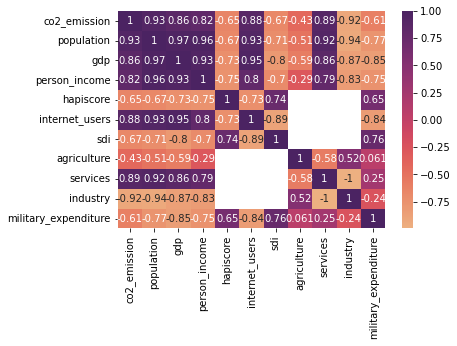

In [95]:
import seaborn as sns
# plot heatmap and pairplot for each countries
#############################
####### United States #######
#############################
corelation_us = us.corr()
sns.heatmap(corelation_us, xticklabels=corelation_us.columns, yticklabels=corelation_us.columns, annot=True,cmap="flare")

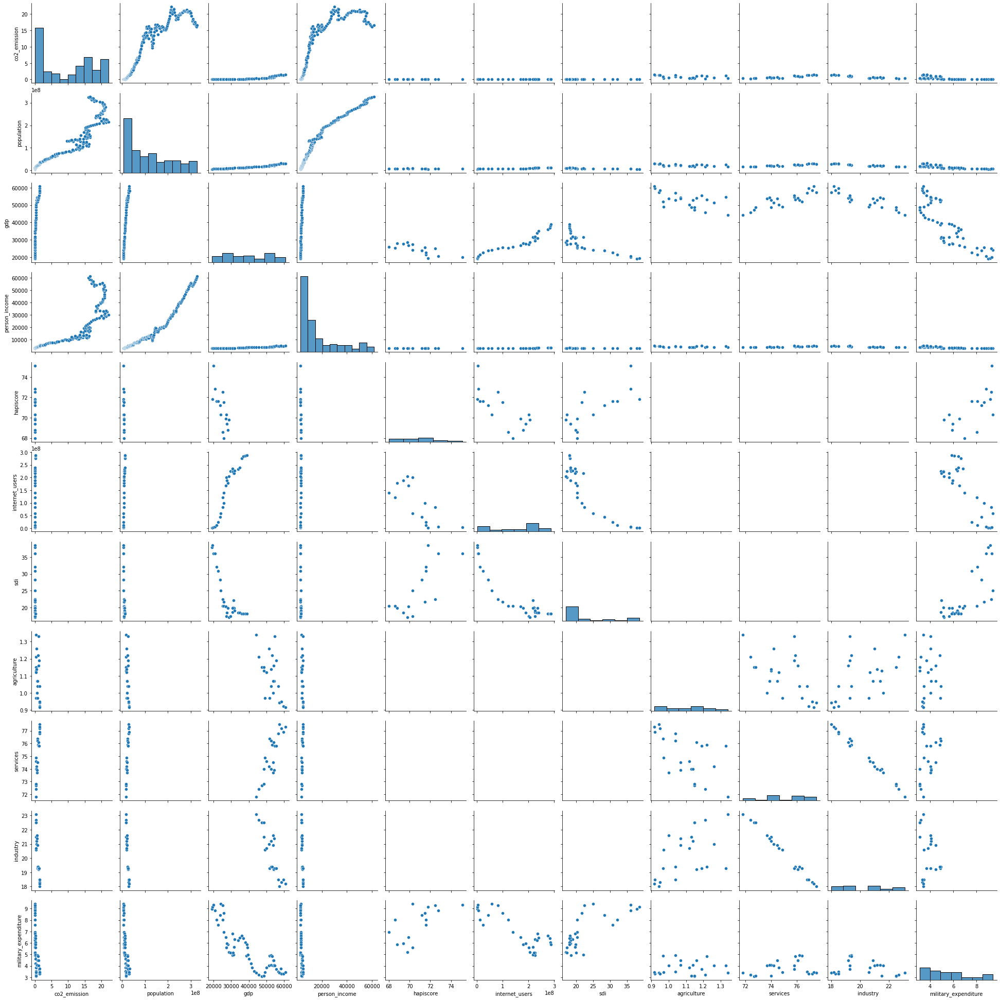

In [96]:
#############################
####### United States #######
#############################
sns.pairplot(us)

<AxesSubplot:>

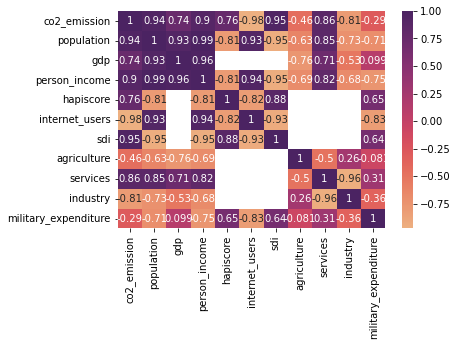

In [98]:
#############################
########## Canada ###########
#############################
corelation_ca = ca.corr()
sns.heatmap(corelation_ca, xticklabels=corelation_ca.columns, yticklabels=corelation_ca.columns, annot=True,cmap="flare")

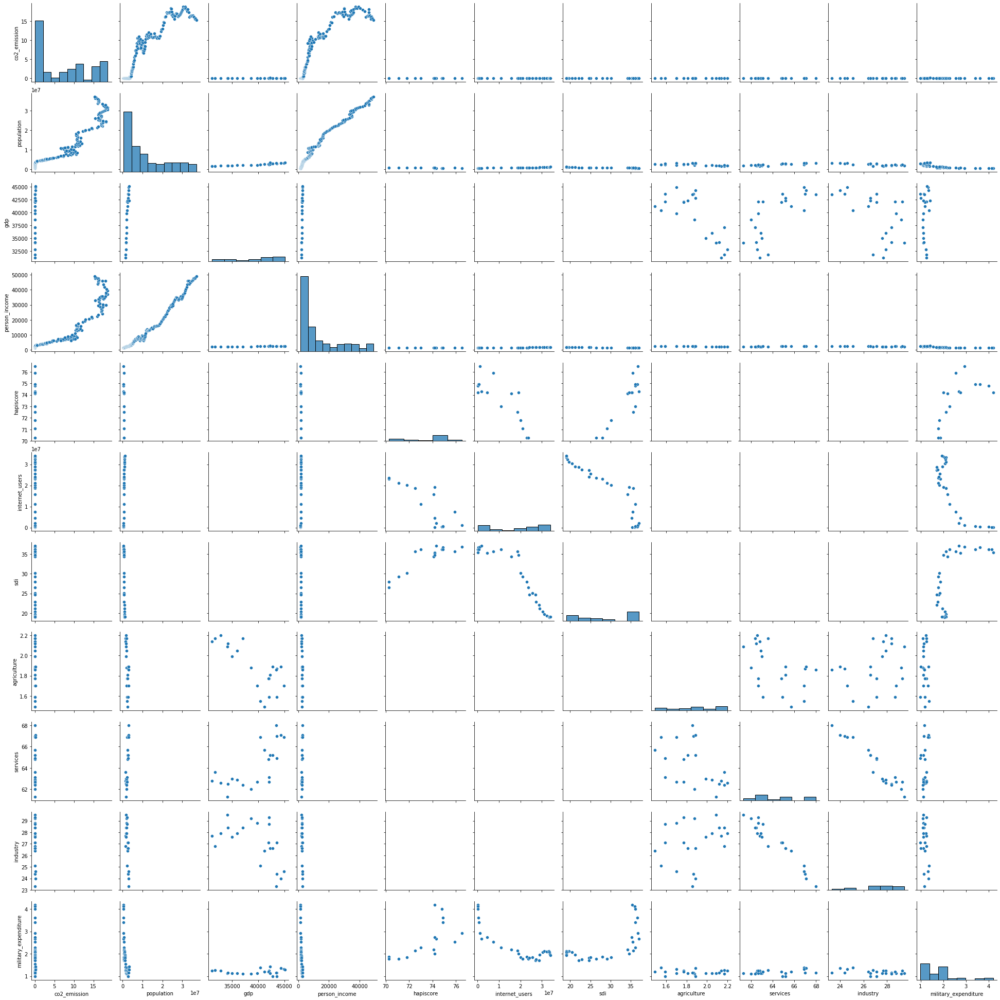

In [99]:
#############################
########## Canada ###########
#############################
sns.pairplot(ca)

<AxesSubplot:>

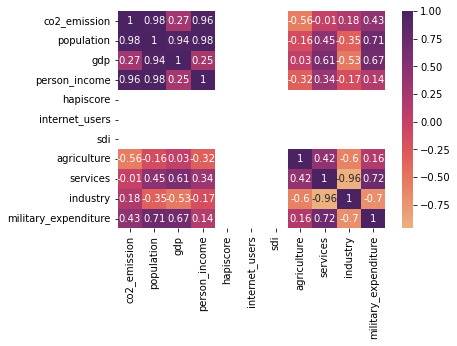

In [100]:
#############################
######### Australia #########
#############################
corelation_au = au.corr()
sns.heatmap(corelation_au, xticklabels=corelation_au.columns, yticklabels=corelation_au.columns, annot=True,cmap="flare")

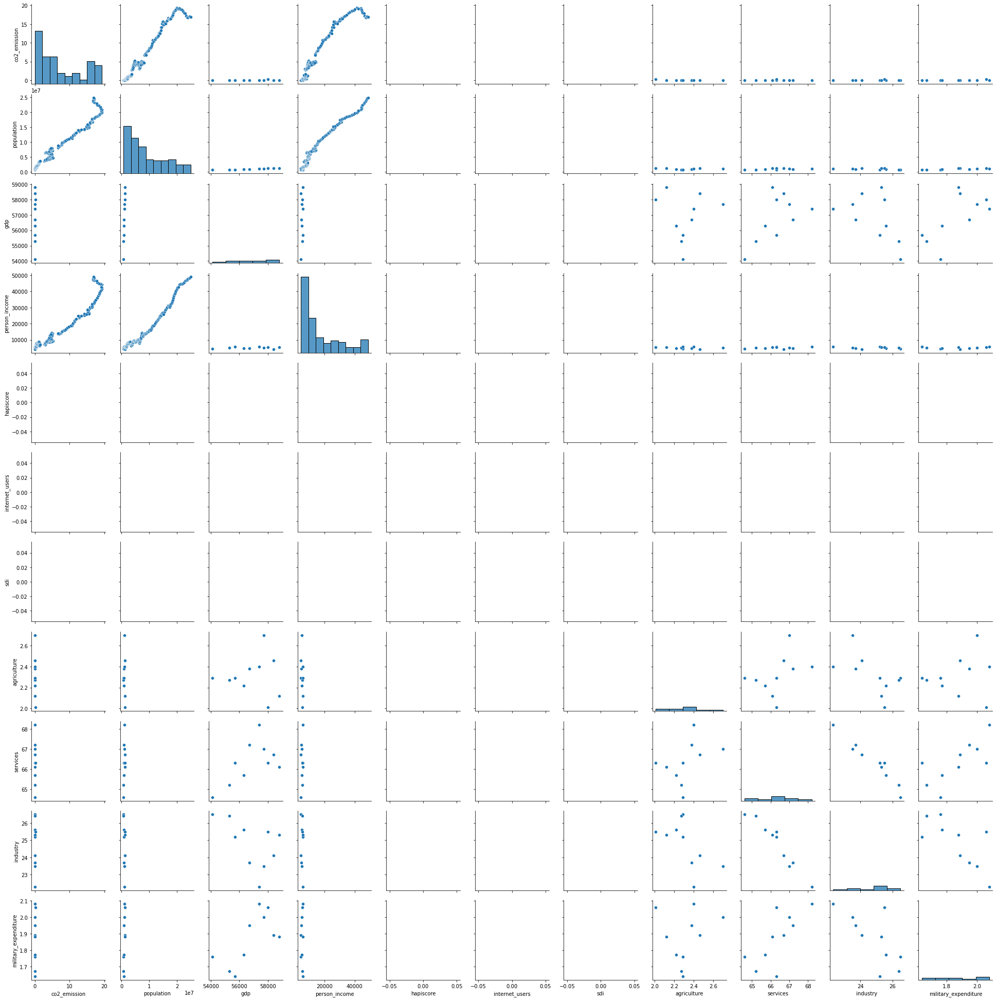

In [101]:
#############################
######### Australia #########
#############################
sns.pairplot(au)

### Observations from the above task:
- **CO2 Emission:**
    - Positively correlated to Population, GDP, Person Income, Number of Internet Users and Service
    - Negatively correlated to other factors
- **Population:**
    - Positively correlated to GDP, Person Income, Number of Internet Users and Service
    - Negatively correlated to Sustainable Development Index, Hapiness Score and Military Expenditure
- **GDP:**
    - Positively correlated to Population, Person Income, Number of Internet Users and Service
    - Negatively correlated to Sustainable Development Index, Hapiness Score and Military Expenditure
- **Happiness Score:**
    - Positively correlated to Sustainable Development Index and Military Expenditure
    - Negatively correlated to all other factors
- There are some **blanks** in heatmap might because of the **NaN values**
- **CO2 Emission** is **disappeared** in both heatmap and pairplot, don't know the reason

## PCA
- Use the ***above 3 data frames*** to ***do PCA analysis***
- Find out the ***contribution to each PC***
- Summarise the ***order of the importance of factors in descending order***

In [129]:
from sklearn import preprocessing 
from sklearn.decomposition import PCA
# normalize the data attributes (numerical ones only)
us.var()

co2_emission            6.186207e+01
population              9.518088e+15
gdp                     1.594088e+08
person_income           2.613956e+08
hapiscore               3.283333e+00
internet_users          9.602147e+15
sdi                     4.628179e+01
agriculture             1.580107e-02
services                2.864229e+00
industry                2.524466e+00
military_expenditure    3.549833e+00
dtype: float64

In [130]:
# Normalization
def norm_to_zero_one(df):
    return (df - df.min()) * 1.0 / (df.max() - df.min())
norm_us = us
for i in us.columns:
    norm_us[i] = norm_to_zero_one(us[i])
norm_us.var()

/var/folders/ky/n9j_n8mn26l476xxlv8f84xr0000gn/T/ipykernel_34808/1877716160.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  norm_us[i] = norm_to_zero_one(us[i])


co2_emission            0.126000
population              0.092372
gdp                     0.091673
person_income           0.075965
hapiscore               0.065133
internet_users          0.118200
sdi                     0.099198
agriculture             0.088309
services                0.088157
industry                0.097058
military_expenditure    0.088593
dtype: float64

In [131]:
norm_ca = ca
for i in ca.columns:
    norm_ca[i] = norm_to_zero_one(ca[i])
norm_ca.var()

/var/folders/ky/n9j_n8mn26l476xxlv8f84xr0000gn/T/ipykernel_34808/4007935982.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  norm_ca[i] = norm_to_zero_one(ca[i])


co2_emission            0.130859
population              0.087027
gdp                     0.101798
person_income           0.083740
hapiscore               0.092191
internet_users          0.135438
sdi                     0.154780
agriculture             0.094886
services                0.088505
industry                0.084697
military_expenditure    0.058223
dtype: float64

In [132]:
norm_au = au
for i in au.columns:
    norm_au[i] = norm_to_zero_one(au[i])
norm_au.var()

/var/folders/ky/n9j_n8mn26l476xxlv8f84xr0000gn/T/ipykernel_34808/2965641005.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  norm_au[i] = norm_to_zero_one(au[i])


co2_emission            0.112060
population              0.078382
gdp                     0.101423
person_income           0.080119
hapiscore                    NaN
internet_users               NaN
sdi                          NaN
agriculture             0.075624
services                0.081970
industry                0.104743
military_expenditure    0.125689
dtype: float64

In [133]:
# select 6 features by variance
new_us = norm_us.reindex(norm_us.var().sort_values(ascending=False).index, axis=1)
new_us = new_us.iloc[:,:6]
print("United Stated 6 most variant features:")
print(list(new_us.columns))

new_au = norm_au.reindex(norm_au.var().sort_values(ascending=False).index, axis=1)
new_au = new_au.iloc[:,:6]
print("Australia 6 most variant features:")
print(list(new_au.columns))

new_ca = norm_ca.reindex(norm_ca.var().sort_values(ascending=False).index, axis=1)
new_ca = new_ca.iloc[:,:6]
print("Canada 6 most variant features:")
print(list(new_ca.columns))

United Stated 6 most variant features:
['co2_emission', 'internet_users', 'sdi', 'industry', 'population', 'gdp']
Australia 6 most variant features:
['military_expenditure', 'co2_emission', 'industry', 'gdp', 'services', 'person_income']
Canada 6 most variant features:
['sdi', 'internet_users', 'co2_emission', 'gdp', 'agriculture', 'hapiscore']


In [134]:
# fiil NaN with mean
new_us = new_us.fillna(new_us.mean())
new_us

,co2_emission,internet_users,sdi,industry,population,gdp
0,0.000000,0.000000,0.967593,0.452685,0.000000,0.000000
1,0.000072,0.003438,1.000000,0.452685,0.000343,0.004796
2,0.000194,0.008596,0.884259,0.452685,0.000717,0.023981
3,0.000208,0.013753,0.884259,0.452685,0.001090,0.038369
4,0.000424,0.037962,0.699074,0.452685,0.001464,0.059952
...,...,...,...,...,...,...
214,0.787885,0.544251,0.275926,0.452685,0.975078,0.487518
215,0.760807,0.544251,0.275926,0.452685,0.981308,0.487518
216,0.738241,0.544251,0.275926,0.452685,0.987539,0.487518
217,0.729215,0.544251,0.275926,0.452685,0.993769,0.487518


In [135]:
# fiil NaN with mean for other two countries
new_ca = new_ca.fillna(new_ca.mean())
new_au = new_au.fillna(new_au.mean())

In [136]:
# Eigenvalues
pca_us = PCA(n_components=6)
pca_us.fit(new_us)
print("United Stated Eigenvalues:")
print(pca_us.singular_values_)


pca_au = PCA(n_components=6)
pca_au.fit(new_au)
print("Australca Eigenvalues:")
print(pca_au.singular_values_)

pca_ca = PCA(n_components=6)
pca_ca.fit(new_ca)
print("Canada Eigenvalues:")
print(pca_ca.singular_values_)

United Stated Eigenvalues:
[6.77587651 2.71746254 2.05121791 1.41597344 1.30186945 0.58380695]
Australca Eigenvalues:
[5.60401048 1.69712172 0.83007914 0.72061725 0.54794915 0.15684647]
Canada Eigenvalues:
[5.34108421 2.89144945 1.93501087 1.10188401 0.76791882 0.4738645 ]


In [137]:
# Eigenvectors
print("United Stated Eigenvectors:")
print(pca_us.components_)
print("Australia Eigenvectors:")
print(pca_au.components_)
print("Canada Eigenvectors:")
print(pca_ca.components_)

United Stated Eigenvectors:
[[ 0.76340088  0.00158485 -0.00117577 -0.00365784  0.64578446  0.0128163 ]
 [ 0.02012258 -0.56081055  0.49228448  0.07705865 -0.00796285 -0.66086394]
 [-0.01800996 -0.47351359  0.46076746 -0.21274362  0.00780469  0.71960622]
 [-0.05283479 -0.05227557  0.06891265  0.97105962  0.06411253  0.20654201]
 [-0.64319161  0.00366983 -0.002623   -0.0757662   0.76073936 -0.04265342]
 [-0.00169174 -0.67714672 -0.7352497   0.00956241  0.00182198  0.02797448]]
Australia Eigenvectors:
[[ 2.41917521e-04  7.66048243e-01 -8.81548810e-05  2.52505049e-04
   2.18334873e-04  6.42782942e-01]
 [ 5.62444949e-01 -2.90625942e-03 -5.16870691e-01  4.43374611e-01
   4.68937915e-01  2.84756333e-03]
 [-1.54149413e-02 -6.42655828e-01 -6.16595766e-03 -6.03867229e-03
   8.76826228e-03  7.65901103e-01]
 [ 2.60730162e-01 -9.67306200e-03  5.45922050e-01  7.02210367e-01
  -3.75055948e-01  1.13563356e-02]
 [ 7.84048222e-01 -7.63162830e-03  1.67503228e-01 -5.48379096e-01
  -2.37381598e-01  9.119071

In [138]:
# explained variance for the top three eigenvectors.
# the top three eigenvectors = top three singular_values
# the first three are the top three
print("United Stated Explained Variance:")
print(pca_us.explained_variance_[:3])

print("Australia Explained Variance:")
print(pca_au.explained_variance_[:3])

print("Canada Explained Variance:")
print(pca_ca.explained_variance_[:3])

United Stated Explained Variance:
[0.21060781 0.03387432 0.01930044]
Australia Explained Variance:
[0.18805349 0.01724684 0.00412594]
Canada Explained Variance:
[0.13085863 0.03835083 0.01717554]


In [139]:
# explained variance ratio
print("United Stated Explained Variance Ratio:")
print(pca_us.explained_variance_ratio_)

print("Australia Explained Variance Ratio:")
print(pca_au.explained_variance_ratio_)

print("Canada Explained Variance Ratio:")
print(pca_ca.explained_variance_ratio_)

United Stated Explained Variance Ratio:
[0.74599556 0.11998651 0.06836422 0.03257733 0.02753849 0.00553788]
Australia Explained Variance Ratio:
[8.76783971e-01 8.04119708e-02 1.92368397e-02 1.44978644e-02
 8.38253236e-03 6.86822081e-04]
Canada Explained Variance Ratio:
[0.66870522 0.19597789 0.08776931 0.02846083 0.01382313 0.00526362]


### Observations from the above task:
- ***United Stated***
    - We can use the **top three** principle components to reduce the dimensionality of this data set, since they account for approximately **94%** of the variation in this data set.
- ***Australia***
    - We can use the **top three** principle components to reduce the dimensionality of this data set, since they account for approximately **97%** of the variation in this data set.
- ***Canada***
    - We can use the **top three** principle components to reduce the dimensionality of this data set, since they account for approximately **95%** of the variation in this data set.

## Conclusion
- There are many problems in source data, e.g. NaN values and weird characters (K,M,B etc.)
- ***United Stated:***
    - CO2 Emission is ***positively correlated*** to Population, GDP, Person Income, Number of Internet Users and Service
    - CO2 Emission is ***negatively correlated*** to other factors
- ***Australia:***
    - CO2 Emission is ***positively correlated*** to Population, GDP, Person Income, Industry and Military Expenditure
    - CO2 Emission is ***negatively correlated*** to other factors
- ***Canada:***
    - CO2 Emission is ***positively correlated*** to Population, GDP, Person Income, Hapiness Score, Sustainable Development Index and Service
    - CO2 Emission is ***negatively correlated*** to other factors